In [8]:
import tensorflow as tf
from sklearn.model_selection import train_test_split
import numpy as np
import matplotlib.pyplot as plt
from keras import layers, models
import pathlib
import os
import cv2
import string
from keras.metrics import Accuracy, Precision, Recall
from sklearn.metrics import classification_report, accuracy_score
from sklearn.metrics import confusion_matrix, precision_score, recall_score
from sklearn.metrics import f1_score
import seaborn as sns
import pandas as pd

In [9]:
class readDataset:
    def __init__(self, datasetpath, imageShape):
        self.datasetpath = datasetpath
        self.imageShape = imageShape
    def imagesPath(self, folder, name):
        images = list(pathlib.Path(os.path.join(self.datasetpath,
                                                folder)).glob('*{}.*'.format(name)))
        return images
    def readImages(self, images, channels):
        listImages = []
        images = np.sort(images)
        for image in images:
            image = tf.io.read_file(str(image))
            image = tf.image.decode_png(image, channels = channels)
            image = tf.image.resize(image, self.imageShape)
            image/= 255
            listImages.append(image)
        return listImages
    def allDataset(self, label):
        images = self.readImages(self.imagesPath(label, name = ')'), channels = 3)
        masks = np.array(self.readImages(self.imagesPath(label, name = 'mask'), channels = 1))
        masks = (masks >= 0.5).astype('int32')
        return np.array(images), masks
    def finalDataset(self, labels):
        images_benign, masks_benign = self.allDataset(labels[0])
        images_malignant, masks_malignant = self.allDataset(labels[1])
        images_normal, masks_normal = self.allDataset(labels[2])
        images = np.vstack([images_benign, images_malignant, images_normal])
        masks = np.vstack([masks_benign, masks_malignant, masks_normal])
        labels = np.hstack([np.ones(shape = (len(images_benign),))*0,
                           np.ones(shape = (len(images_malignant), ))*1,
                           np.ones(shape = (len(images_normal), ))*2])
        return images, masks, labels
    def dataAugmentation(self, images, masks, labels):
        imagesupdate = []
        masksupdate = []
        labelsupdate = []
        for image, mask, label in zip(images, labels, masks):
          for aug in range(5):
            imageup = image
            maskup = mask
            if aug == 0:
              imageup = image
              maskup = mask
            elif aug == 1:
              imageup = tf.image.adjust_contrast(imageup, contrast_factor = 2)
            elif aug == 2:
              imageup = tf.image.adjust_brightness(imageup, delta = 0.3)
            elif aug == 3:
              imageup = tf.image.flip_left_right(imageup)
              maskup = tf.image.flip_left_right(maskup)
            else:
              imageup = cv2.GaussianBlur(imageup,(5, 5),0)
            imagesupdate.append(imageup), masksupdate.append(maskup), labelsupdate.append(label)
        return np.array(imagesupdate), np.array(masksupdate), np.array(labelsupdate)

In [10]:
datasetpath = 'breast-ultrasound-images-dataset/Dataset_BUSI_with_GT'
datasetObject = readDataset(datasetpath, [128, 128])
images, masks, labels = datasetObject.finalDataset(['benign', 'malignant', 'normal'])

In [11]:
images.shape, masks.shape, labels.shape

((780, 128, 128, 3), (780, 128, 128, 1), (780,))

In [12]:
images, masks, labels = datasetObject.dataAugmentation(images, labels, masks)
images.shape, masks.shape, labels.shape

((3900, 128, 128, 3), (3900, 128, 128, 1), (3900,))

In [13]:
np.unique(labels, return_counts = True)

(array([0., 1., 2.]), array([2185, 1050,  665]))

In [15]:
np.unique(masks, return_counts = True)

(array([0, 1], dtype=int32), array([58967165,  4930435]))

In [16]:
np.min(images), np.max(images)

(-0.66371256, 1.8423392)

In [17]:
def showImagesWithMask(images, masks, labels):
    plt.figure(figsize = (12, 12))
    for i in range(len(images)):
        plt.subplot(8, 8, (i + 1))
        plt.imshow(images[i])
        plt.imshow(masks[i], alpha = 0.3, cmap = 'jet')
        plt.title(labels[i])
    plt.legend()

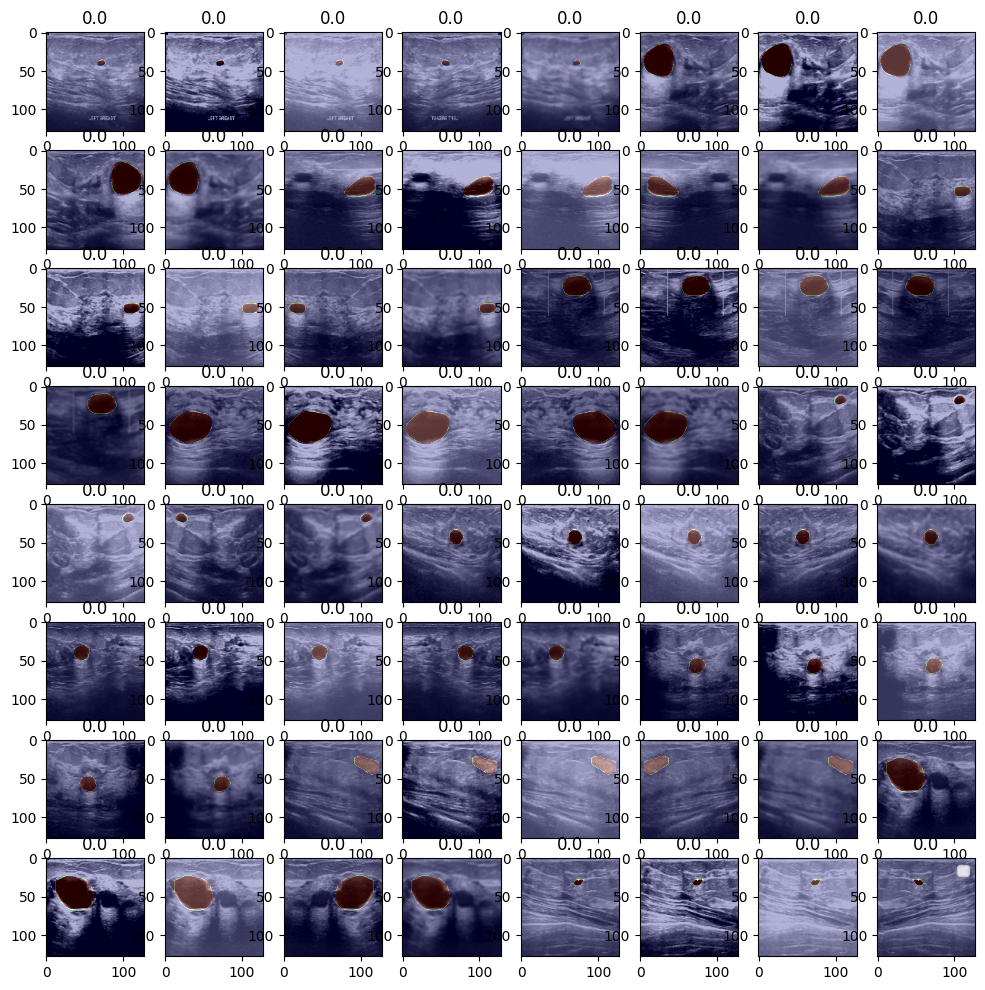

In [18]:
showImagesWithMask(images[:64], masks[:64], labels[:64])

In [20]:
randomIndexs = np.random.randint(0, len(images), size = (len(images), ))
images = images[randomIndexs]
masks = masks[randomIndexs]
labels = labels[randomIndexs]
images.shape, masks.shape, labels.shape

((3900, 128, 128, 3), (3900, 128, 128, 1), (3900,))

In [21]:
valid = int(len(images)*0.15)
trainDataset = [images[:images.shape[0] - valid],
         masks[:images.shape[0] - valid],
         labels[:images.shape[0] - valid]]
validDataset = [images[images.shape[0] - valid:],
         masks[images.shape[0] - valid:],
         labels[images.shape[0] - valid:]]

In [22]:
trainDataset[0].shape, trainDataset[1].shape, trainDataset[2].shape

((3315, 128, 128, 3), (3315, 128, 128, 1), (3315,))

In [23]:
validDataset[0].shape, validDataset[1].shape, validDataset[2].shape

((585, 128, 128, 3), (585, 128, 128, 1), (585,))

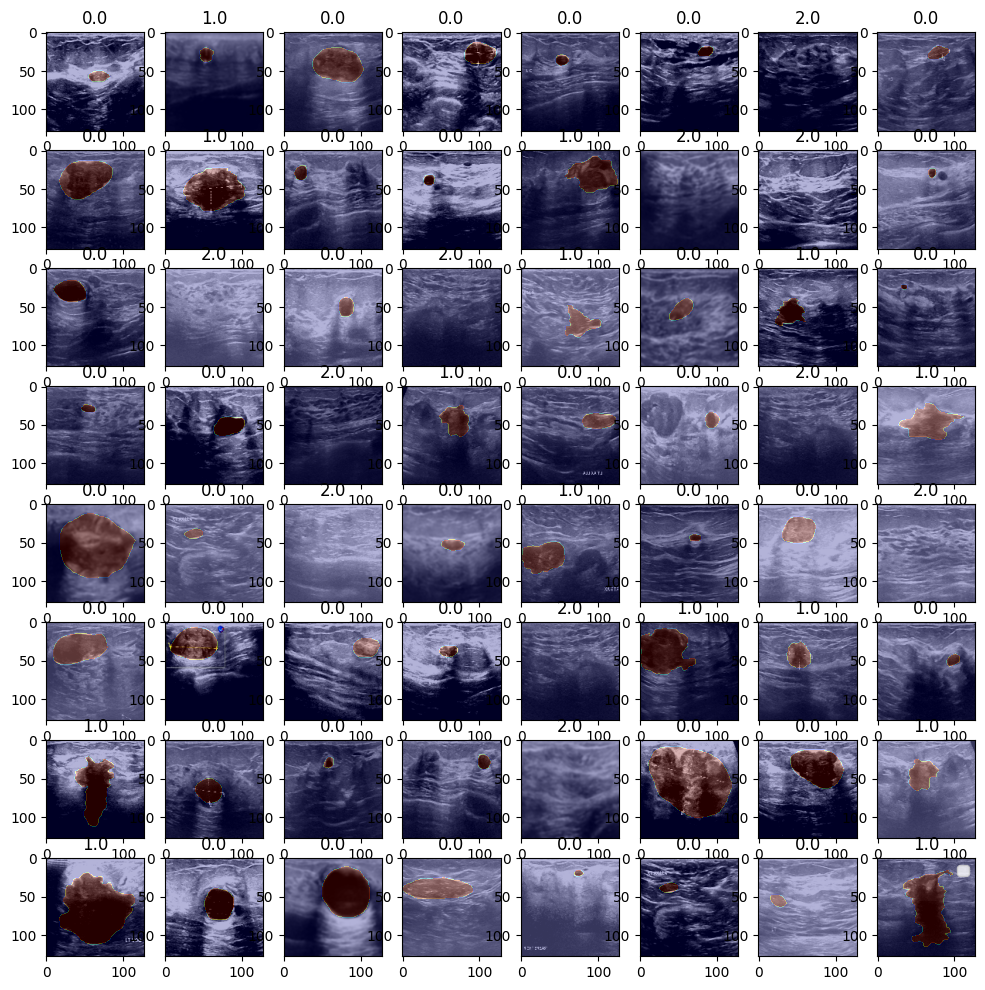

In [24]:
showImagesWithMask(trainDataset[0][:64], trainDataset[1][:64], trainDataset[2][:64])

In [19]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
curr = layers.Flatten()(trainDataset[0])
scaler.fit(curr)
trainImages = scaler.transform(curr)
validImages = scaler.transform(layers.Flatten()(validDataset[0]))
trainDataset[0] = np.reshape(trainImages, (trainDataset[0].shape[0], 128, 128, 3))
validDataset[0] = np.reshape(validImages, (validDataset[0].shape[0], 128, 128, 3))
trainDataset[0].shape, validDataset[0].shape

((3315, 128, 128, 3), (585, 128, 128, 3))

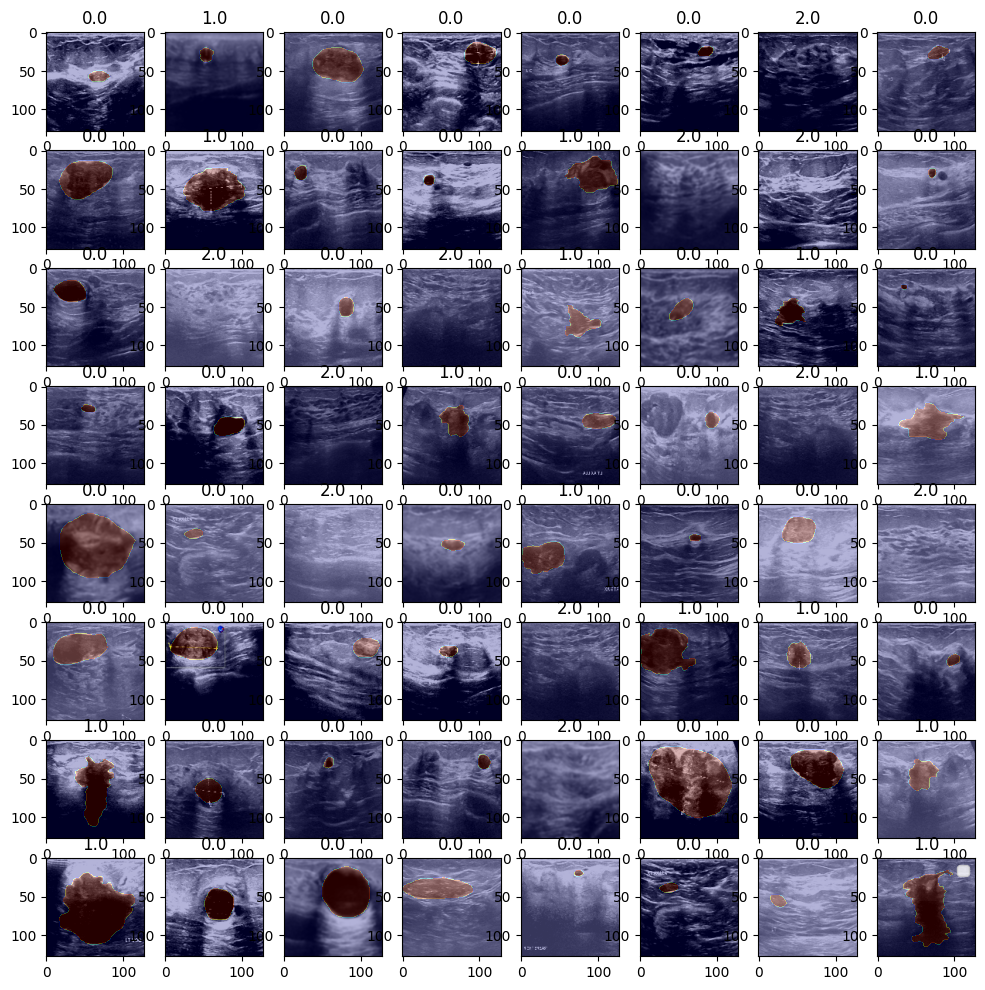

In [27]:
showImagesWithMask(trainDataset[0][:64], trainDataset[1][:64], trainDataset[2][:64])

In [28]:
np.min(trainDataset[0]), np.max(trainDataset[0])

(-0.5230546, 1.8423392)

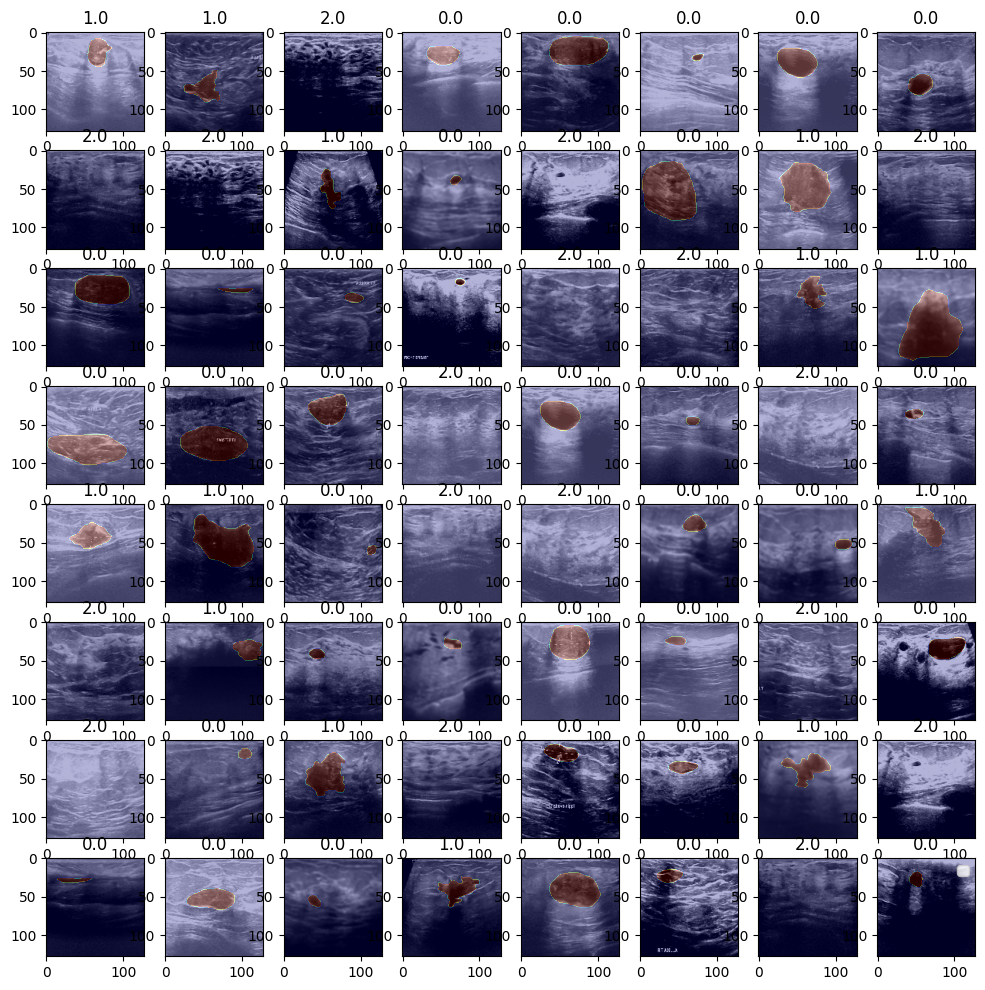

In [29]:
showImagesWithMask(validDataset[0][:64], validDataset[1][:64], validDataset[2][:64])

In [23]:
np.min(validDataset[0]), np.max(validDataset[0])

(-0.10340990343745515, 1.3477667904187567)

In [36]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.metrics import Precision, Recall

def convolution(inputs, padding, strides, filters, kernel_size):
    x = inputs
    y = layers.Conv2D(filters, kernel_size=1, padding=padding,
                      strides=strides,
                      kernel_regularizer=tf.keras.regularizers.L2(0.001))(x)
    x = layers.Conv2D(filters, kernel_size=kernel_size, padding=padding,
                      strides=strides,
                      kernel_regularizer=tf.keras.regularizers.L2(0.001))(y)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.Conv2D(filters, kernel_size=kernel_size, padding=padding,
                      strides=strides,
                      kernel_regularizer=tf.keras.regularizers.L2(0.001))(x)
    x = layers.BatchNormalization()(x)
    x = layers.add([x, y])
    x = layers.Activation('relu')(x)
    return x

def encoder(inputs, filters):
    correlation = convolution(inputs, padding='same', strides=1, filters=filters, kernel_size=5)
    downsample = layers.AveragePooling2D(pool_size=(2, 2))(correlation)
    return correlation, downsample

def decoder(inputs, skip_connection, filters):
    upsample = layers.Conv2DTranspose(filters, 5, padding='same', strides=2,
                                      kernel_regularizer=tf.keras.regularizers.L2(0.001))(inputs)
    upsample = layers.Activation('relu')(upsample)
    upsample = layers.BatchNormalization()(upsample)
    connection = layers.add([upsample, skip_connection])
    correlation = convolution(connection, padding='same', strides=1, filters=filters, kernel_size=5)
    return correlation

input_layer = layers.Input(shape=(128, 128, 3))
filters = 16

# Encoder
corr1, downsample1 = encoder(input_layer, filters)
corr2, downsample2 = encoder(downsample1, filters*2)
corr3, downsample3 = encoder(downsample2, filters*4)
corr4, downsample4 = encoder(downsample3, filters*8)
downsample4 = convolution(downsample4, padding='same', strides=1, filters=filters*8, kernel_size=5)

# Feature vectors
features_vector_1 = layers.GlobalAveragePooling2D()(downsample4)
features_vector_2 = layers.Flatten()(downsample4)
features_vector_2 = layers.Dropout(0.7)(features_vector_2)
features_vector_1 = layers.Dropout(0.5)(features_vector_1)

# Latent space
encoder_x = layers.Dense(64, name='latent_space', kernel_regularizer=tf.keras.regularizers.L2(0.001))(features_vector_1)
x = layers.Dense(downsample4.shape[1]*downsample4.shape[2]*downsample4.shape[3],
                 kernel_regularizer=tf.keras.regularizers.L2(0.001))(encoder_x)
x = layers.Reshape((downsample4.shape[1], downsample4.shape[2], downsample4.shape[3]), name='reshape')(x)
x = layers.BatchNormalization()(x)
x = layers.Dropout(0.4)(x)

# Decoder
decoder_corr1 = decoder(x, corr4, filters*8)
decoder_corr2 = decoder(decoder_corr1, corr3, filters*4)
decoder_corr3 = decoder(decoder_corr2, corr2, filters*2)
decoder_corr4 = decoder(decoder_corr3, corr1, filters)
output = layers.Conv2DTranspose(1, 5, padding='same', strides=1)(decoder_corr4)
output = layers.Activation('sigmoid', name='UNET')(output)

# Label output
label_output = layers.Dense(32, activation='relu')(features_vector_2)
label_output = layers.BatchNormalization()(label_output)
label_output = layers.Dropout(0.5)(label_output)
label_output = layers.Dense(16, activation='relu')(label_output)
label_output = layers.BatchNormalization()(label_output)
label_output = layers.Dropout(0.5)(label_output)
label_output = layers.Dense(1, name='label')(label_output)

# Model
model = models.Model(inputs=input_layer, outputs=[output, label_output])
model.compile(
    loss=[tf.keras.losses.BinaryFocalCrossentropy(), 'mae'],
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.00001),
    metrics=['accuracy', Precision(name='precision'), Recall(name='recall')]
)
model.summary()


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_9 (Conv2D)   │ (None, 128, 128,  │         64 │ input_layer_3[0]… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_10 (Conv2D)  │ (None, 128, 128,  │      6,416 │ conv2d_9[0][0]    │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │         64 │ conv2d_10[0][0]   │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_6        │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (Activation)        │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_11 (Conv2D)  │ (None, 128, 128,  │      6,416 │ activation_6[0][… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │         64 │ conv2d_11[0][0]   │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_3 (Add)         │ (None, 128, 128,  │          0 │ batch_normalizat… │
│                     │ 16)               │            │ conv2d_9[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_7        │ (None, 128, 128,  │          0 │ add_3[0][0]       │
│ (Activation)        │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ average_pooling2d   │ (None, 64, 64,    │          0 │ activation_7[0][… │
│ (AveragePooling2D)  │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_12 (Conv2D)  │ (None, 64, 64,    │        544 │ average_pooling2… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_13 (Conv2D)  │ (None, 64, 64,    │     25,632 │ conv2d_12[0][0]   │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        128 │ conv2d_13[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_8        │ (None, 64, 64,    │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_14 (Conv2D)  │ (None, 64, 64,    │     25,632 │ activation_8[0][… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        128 │ conv2d_14[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_4 (Add)         │ (None, 64, 64,    │          0 │ batch_normalizat

 Total params: 4,534,994 (17.30 MB)

 Trainable params: 4,531,730 (17.29 MB)

 Non-trainable params: 3,264 (12.75 KB)

In [38]:
tf.keras.utils.plot_model(model,
                          show_shapes=True,
                          show_layer_names=True)


In [42]:
model.compile(
    loss=[tf.keras.losses.BinaryFocalCrossentropy(), 'mae'],
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.00001),
    metrics={
        "UNET": ['accuracy'],
        "label": [Precision(name='precision'), Recall(name='recall')]
    }
)


In [44]:
history = model.fit(
    trainDataset[0], 
    [trainDataset[1], trainDataset[2]], 
    epochs=70,
    validation_data=(validDataset[0], [validDataset[1], validDataset[2]]),
    batch_size=16, 
    callbacks=[
        tf.keras.callbacks.EarlyStopping(
            patience=12, 
            monitor='val_loss',
            mode='min', 
            restore_best_weights=True
        ),
    ]
)


Epoch 1/70
208/208 ━━━━━━━━━━━━━━━━━━━━ 17s 80ms/step - UNET_accuracy: 0.9835 - label_precision: 0.4601 - label_recall: 0.4854 - loss: 2.1290 - val_UNET_accuracy: 0.9721 - val_label_precision: 0.6583 - val_label_recall: 0.5481 - val_loss: 1.7864
Epoch 2/70
208/208 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - UNET_accuracy: 0.9816 - label_precision: 0.5180 - label_recall: 0.5137 - loss: 2.1096 - val_UNET_accuracy: 0.9612 - val_label_precision: 0.6383 - val_label_recall: 0.1255 - val_loss: 1.9541
Epoch 3/70
208/208 ━━━━━━━━━━━━━━━━━━━━ 16s 78ms/step - UNET_accuracy: 0.9838 - label_precision: 0.4358 - label_recall: 0.4438 - loss: 2.1631 - val_UNET_accuracy: 0.9731 - val_label_precision: 0.7364 - val_label_recall: 0.3975 - val_loss: 1.8129
Epoch 4/70
208/208 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - UNET_accuracy: 0.9846 - label_precision: 0.4593 - label_recall: 0.4738 - loss: 2.1003 - val_UNET_accuracy: 0.9715 - val_label_precision: 0.6449 - val_label_recall: 0.5774 - val_loss: 1.7958
Epoch 5/70
208/2

In [46]:
model.evaluate(trainDataset[0], [trainDataset[1], trainDataset[2]])

104/104 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - UNET_accuracy: 0.9860 - label_precision: 0.7733 - label_recall: 0.6479 - loss: 1.6036


[1.5994406938552856,
 0.9859068393707275,
 0.7748058438301086,
 0.6284114718437195]

In [47]:
model.evaluate(validDataset[0], [validDataset[1], validDataset[2]])

19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - UNET_accuracy: 0.9729 - label_precision: 0.7505 - label_recall: 0.6156 - loss: 1.6194


[1.6036169528961182,
 0.9726744294166565,
 0.7562189102172852,
 0.6359832882881165]

In [50]:
masks_pred, _ = model.predict(validDataset[0])

19/19 ━━━━━━━━━━━━━━━━━━━━ 5s 169ms/step


In [51]:
masks_pred.shape, validDataset[1].shape

((585, 128, 128, 1), (585, 128, 128, 1))

In [52]:
masks_pred = (masks_pred >= 0.5).astype('int32')
np.unique(masks_pred), np.unique(validDataset[1])

(array([0, 1], dtype=int32), array([0, 1], dtype=int32))

In [53]:
masks_pred = layers.Flatten()(masks_pred)
masks_pred  = np.reshape(masks_pred, -1)
masks_actual = layers.Flatten()(validDataset[1])
masks_actual  = np.reshape(masks_actual, -1)
masks_pred.shape, masks_actual.shape

((9584640,), (9584640,))

In [54]:
print(classification_report(masks_actual, masks_pred))

              precision    recall  f1-score   support

         0.0       0.99      0.98      0.99   8830470
         1.0       0.78      0.91      0.84    754170

    accuracy                           0.97   9584640
   macro avg       0.89      0.94      0.91   9584640
weighted avg       0.98      0.97      0.97   9584640



In [55]:
tn, fp, fn, tp = confusion_matrix(masks_actual, masks_pred).ravel()

In [56]:
metrics = pd.DataFrame([accuracy_score(masks_actual, masks_pred)*100,
                        precision_score(masks_actual, masks_pred)*100,
                        recall_score(masks_actual, masks_pred)*100,
                        f1_score(masks_actual, masks_pred)*100,
                        (tn / (tn+fp))*100,
                        (2*tp/(2*tp + fp + fn))*100,
                        (tp/(tp + fn))*100],
                       index = ['Accuracy Score', 'Precision Score',
                                'Recall Score', 'F1 Score', 'specificity',
                                'dice Score', 'sensitivity'],
                       columns = ['Metrics For Validation Data'])
metrics.head(n= 8)

,Metrics For Validation Data
Accuracy Score,97.267440
Precision Score,78.189165
Recall Score,90.523887
F1 Score,83.905626
specificity,97.843376
dice Score,83.905626
sensitivity,90.523887


In [66]:
def segmentation(data):
    masks_pred, _ = model.predict(data)
    masks_pred = np.array(masks_pred)
    masks_pred = (masks_pred >= 0.5).astype('int32')
    return masks_pred  # Ensure the function returns the predicted masks


In [67]:
valid_masks = segmentation(validDataset[0])
print(valid_masks.shape)  # This should now print the shape of valid_masks


19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step
(585, 128, 128, 1)


In [68]:
def draw(images, masks, y_pred):
  plt.figure(figsize = (12, 50))
  index = -1
  n = np.random.randint(y_pred.shape[0])
  for i in range(120):
    plt.subplot(20, 6, (i + 1))
    if index == -1:
      plt.imshow(images[n])
      plt.title('Image')
      index = 0
    elif index == 0:
      plt.imshow(images[n])
      plt.imshow(masks[n], alpha = 0.3, cmap = 'jet')
      plt.title('Original Mask')
      index = 1
    elif index == 1:
      plt.imshow(images[n])
      plt.imshow(np.reshape(y_pred[n], (128, 128)), alpha = 0.3, cmap = 'jet')
      plt.title('Predict Mask')
      index = -1
      n = np.random.randint(y_pred.shape[0])
  plt.legend()

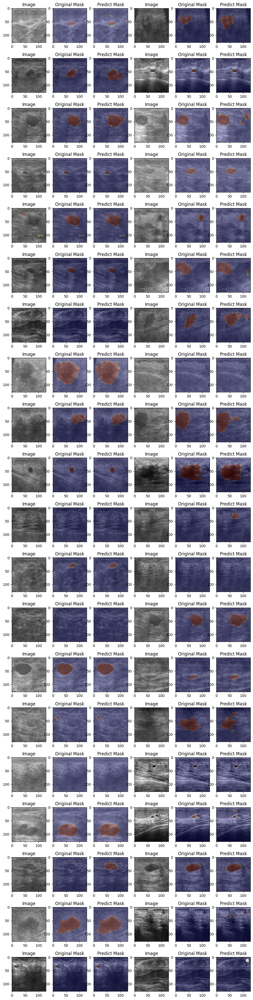

In [69]:
draw(validDataset[0], validDataset[1], valid_masks)